# Predicción de enfermedades cardiacas

## 1. Presentación:

Somos un equipo de trabajo conformado por estudiantes de Coderhouse.
 
Nos planteamos predecir ataques cardíacos en relación a un rango etario y género, por lo tanto el análisis que realizaremos será tanto bivariado como multivariado.
 
El equipo se encuentra conformado por:<br>
- Richard Hervier
- Omar Honigman
- Nicolas Abihaggle
- Mayco Ñañez

### 1.1 Objetivos del trabajo:

Las enfermedades cardiovasculartes son un conjunto de trastornos del corazón responsables de millones de fallecimientos al año.
Por lo tanto, queremos generar un modelo que permita pesquisar indicios de si los pacientes podrían tener complicaciones cardíacas, a los fines de que los pacientes reciban tratamientos para prevenir ataques cardíacos en relación a un rango etario y género.

### 1.2 Obtención de la información:
La data elegida se encuentra en la página de kaggle: https://www.kaggle.com/code/kamilpytlak/fitting-the-best-logistic-regression-model/data. <br>
Cuenta con un archivo, "heart_2020_cleaned.csv", el cual contiene la siguiente información:

### 1.3 Descripción del dataset:

#### Variables:

1. **HeartDisease:** Indica si alguna vez ha reportado una enfermedad coronaria (CHD) o un infarto al miocardio (MI).
2. **BMI:** Índice de masa corporal. Utiliza la altura y peso de un individuo para calcular la grasa corporal y determinar el rango en el que se encuentra.
3. **Smoking:** Indica si el individuo ha fumado al menos 100 cigarrillos en su vida.
4. **AlcoholDrinking:** Si se ingiere más de 14 bebidas por semana en el caso de los hombres, o 7 bebidas a la semana en caso de las mujeres.
5. **Stroke:** Ha tenido alguna vez un derrame cerebral.
6. **PhysicalHealth:** Durante los últimos 30 días, ¿cuántos días se ha sentido mal físicamente?
7. **MentalHealth:** Durante los últimos 30 días, ¿cuántos días se ha sentido mal mentalmente?
8. **DiffWalking:** Indica si tiene problemas serios para caminar o subir escaleras.
9. **Sex:** Indica si el paciente es Hombre (Male) o Mujer (Female).
10. **AgeCategory:** Indica en cuál de las categorías de edad se encuentra.
11. **Race:** Indica la raza del individuo. Las opciones son: 'White', 'Black', 'Asian', 'American Indian/Alaskan Native', 'Hispanic' y 'Other'.
12. **Diabetic:** ¿Alguna vez ha tenido diabetes? Las opciones son: 'Yes', 'No', 'No, borderline diabetes' y 'Yes (during pregnancy)'.
13. **PhysicalActivity:** Indica si realizar alguna actividad física, aparte de su trabajo diario.
14. **GenHealth:** En general que tan bien se salud se siente el individuo. Las opciones son: 'Poor', 'Fair', 'Good', 'Very good' y 'Excellent'.
15. **SleepTime:** En promedio, cuantas horas de sueño tiene el individuo en un periodo de 24 horas.
16. **Asthma:** ¿Alguna vez ha tenido asma?
17. **KidneyDisease:** ¿Alguna vez ha tenido enfermedades a los riñones?
18. **SkinCancer:** ¿Alguna vez ha tenido cáncer de piel?


## 2. Revision del DataFrame

### 2.1 Importacion de las librerias a usar:

In [36]:
import numpy as np
import pandas as pd
import seaborn as sns
import matplotlib.pyplot as plt
import pandas_profiling

### 2.2 Creación del dataframe:

In [37]:
df = pd.read_csv("data_final.csv")
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,No,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,No,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,No,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,No,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,No,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


### 2.3 Caracteristicas:

In [38]:
print('\033[1m'+f"La data tiene {df.shape[0]} observaciones y {df.shape[1]} variables.")

La data tiene 319795 observaciones y 18 variables.


In [39]:
print('\033[1m'+f"Totalidad de registros por columnas:") 
df.count()

Totalidad de registros por columnas:


HeartDisease        319795
BMI                 319795
Smoking             319795
AlcoholDrinking     319795
Stroke              319795
PhysicalHealth      319795
MentalHealth        319795
DiffWalking         319795
Sex                 319795
AgeCategory         319795
Race                319795
Diabetic            319795
PhysicalActivity    319795
GenHealth           319795
SleepTime           319795
Asthma              319795
KidneyDisease       319795
SkinCancer          319795
dtype: int64

In [40]:
print('\033[1m'+"Revision de datos faltantes:")
df.isnull().any()

Revision de datos faltantes:


HeartDisease        False
BMI                 False
Smoking             False
AlcoholDrinking     False
Stroke              False
PhysicalHealth      False
MentalHealth        False
DiffWalking         False
Sex                 False
AgeCategory         False
Race                False
Diabetic            False
PhysicalActivity    False
GenHealth           False
SleepTime           False
Asthma              False
KidneyDisease       False
SkinCancer          False
dtype: bool

Se observa que no hay datos faltantes.

In [41]:
print('\033[1m'+"Revision de las variables:")
df.columns

Revision de las variables:


Index(['HeartDisease', 'BMI', 'Smoking', 'AlcoholDrinking', 'Stroke',
       'PhysicalHealth', 'MentalHealth', 'DiffWalking', 'Sex', 'AgeCategory',
       'Race', 'Diabetic', 'PhysicalActivity', 'GenHealth', 'SleepTime',
       'Asthma', 'KidneyDisease', 'SkinCancer'],
      dtype='object')

In [42]:
print('\033[1m'+"Tipo de datos por columna:")
df.dtypes

Tipo de datos por columna:


HeartDisease         object
BMI                 float64
Smoking              object
AlcoholDrinking      object
Stroke               object
PhysicalHealth      float64
MentalHealth        float64
DiffWalking          object
Sex                  object
AgeCategory          object
Race                 object
Diabetic             object
PhysicalActivity     object
GenHealth            object
SleepTime           float64
Asthma               object
KidneyDisease        object
SkinCancer           object
dtype: object

In [43]:
print('\033[1m'+"Principales caracteristicas estadisticas:")
df.describe(include="all")

Principales caracteristicas estadisticas:


,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
count,319795,319795.000000,319795,319795,319795,319795.00000,319795.000000,319795,319795,319795,319795,319795,319795,319795,319795.000000,319795,319795,319795
unique,2,NaN,2,2,2,NaN,NaN,2,2,13,6,4,2,5,NaN,2,2,2
top,No,NaN,No,No,No,NaN,NaN,No,Female,65-69,White,No,Yes,Very good,NaN,No,No,No
freq,292422,NaN,187887,298018,307726,NaN,NaN,275385,167805,34151,245212,269653,247957,113858,NaN,276923,308016,289976
mean,NaN,28.325399,NaN,NaN,NaN,3.37171,3.898366,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.097075,NaN,NaN,NaN
std,NaN,6.356100,NaN,NaN,NaN,7.95085,7.955235,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.436007,NaN,NaN,NaN
min,NaN,12.020000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,1.000000,NaN,NaN,NaN
25%,NaN,24.030000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,6.000000,NaN,NaN,NaN
50%,NaN,27.340000,NaN,NaN,NaN,0.00000,0.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,7.000000,NaN,NaN,NaN
75%,NaN,31.420000,NaN,NaN,NaN,2.00000,3.000000,NaN,NaN,NaN,NaN,NaN,NaN,NaN,8.000000,NaN,NaN,NaN


### 2.4 Cambios en el dataframe:
Cambiaremos los valores de la columna "HeartDisease", para facilitar el analisis.
- "No" cambiara a "0"
- "Yes" cambiara a "1"

In [44]:
df["HeartDisease"] = df["HeartDisease"].replace({"No": 0, "Yes": 1})
df.head()

,HeartDisease,BMI,Smoking,AlcoholDrinking,Stroke,PhysicalHealth,MentalHealth,DiffWalking,Sex,AgeCategory,Race,Diabetic,PhysicalActivity,GenHealth,SleepTime,Asthma,KidneyDisease,SkinCancer
0,0,16.60,Yes,No,No,3.0,30.0,No,Female,55-59,White,Yes,Yes,Very good,5.0,Yes,No,Yes
1,0,20.34,No,No,Yes,0.0,0.0,No,Female,80 or older,White,No,Yes,Very good,7.0,No,No,No
2,0,26.58,Yes,No,No,20.0,30.0,No,Male,65-69,White,Yes,Yes,Fair,8.0,Yes,No,No
3,0,24.21,No,No,No,0.0,0.0,No,Female,75-79,White,No,No,Good,6.0,No,No,Yes
4,0,23.71,No,No,No,28.0,0.0,Yes,Female,40-44,White,No,Yes,Very good,8.0,No,No,No


### 2.5 Distribución de frecuencias para SleepTime
Crearemos un nuevo dataframe con la distribución de frecuencias de las horas de sueño

In [45]:
# Iniciamos creando el dataframe, con los datos de SleepTime, ordenados, y cambiando el nombre a Frecuencia Absoluta ("F_Abso")
HS_df = pd.DataFrame(df["SleepTime"].value_counts().sort_index())
HS_df.rename(columns = {"SleepTime":"F_Abso"}, inplace=True)
HS_df.head()

,F_Abso
1.0,551
2.0,788
3.0,1992
4.0,7750
5.0,19184


In [46]:
# Creamos la columna de Frecuencias Absolutas Acumuladas ("F_Abso_Acu").
valores = HS_df["F_Abso"].values
acumulada = []
valor = 0
for x in valores:
    valor = valor + x
    acumulada.append(valor)
    
HS_df["F_Abso_Acu"] = acumulada
HS_df.head()

,F_Abso,F_Abso_Acu
1.0,551,551
2.0,788,1339
3.0,1992,3331
4.0,7750,11081
5.0,19184,30265


In [47]:
# Agregamos la columna de Frecuencia relativa ("F_Rel_%")
HS_df["F_Rel_%"] = 100 * HS_df["F_Abso"]/len(df.SleepTime)
HS_df.head()

,F_Abso,F_Abso_Acu,F_Rel_%
1.0,551,551,0.172298
2.0,788,1339,0.246408
3.0,1992,3331,0.622899
4.0,7750,11081,2.423428
5.0,19184,30265,5.998843


In [48]:
# Agregamos la Frecuencia Relativa Acumulada ("F_Rel_%_Acu")
valores2 = HS_df["F_Rel_%"].values
acumulada2 = []
valor2 = 0
for x in valores2:
    valor2 = valor2 + x
    acumulada2.append(valor2)
    
HS_df["F_Rel_%_Acu"] = acumulada2

In [49]:
# Finalmente visualizamos la tabla completa
HS_df

,F_Abso,F_Abso_Acu,F_Rel_%,F_Rel_%_Acu
1.0,551,551,0.172298,0.172298
2.0,788,1339,0.246408,0.418706
3.0,1992,3331,0.622899,1.041605
4.0,7750,11081,2.423428,3.465032
5.0,19184,30265,5.998843,9.463875
6.0,66721,96986,20.863678,30.327554
7.0,97751,194737,30.566769,60.894323
8.0,97602,292339,30.520177,91.414500
9.0,16041,308380,5.016026,96.430526
10.0,7796,316176,2.437812,98.868338


## 3. Graficos

### 3.1 Pandas profiling

In [50]:
# Generamos el profiling de la data:
pandas_profiling.ProfileReport(df)

Summarize dataset:   0%|          | 0/5 [00:00<?, ?it/s]

Generate report structure:   0%|          | 0/1 [00:00<?, ?it/s]

Render HTML:   0%|          | 0/1 [00:00<?, ?it/s]

### 3.2 Heatmap

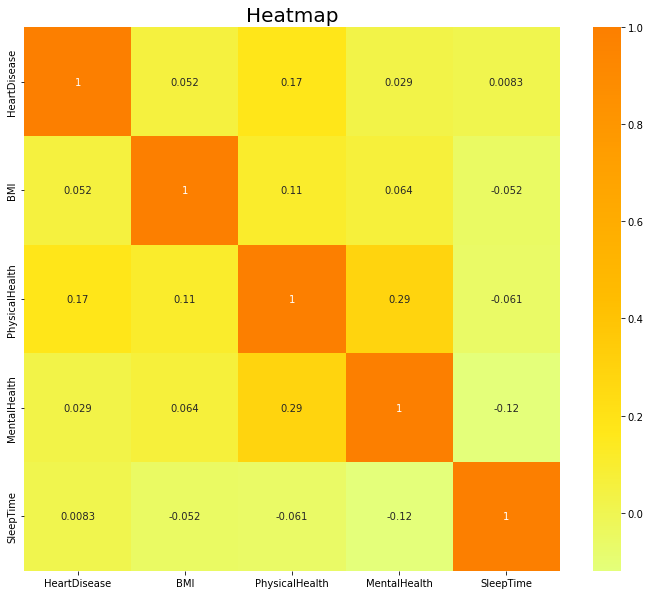

In [51]:
plt.figure(figsize=(12,10))
sns.heatmap(df.corr(), annot = True, cmap = 'Wistia')
plt.title('Heatmap', fontsize = 20)
plt.show()

### 3.3 Salud fisica y mental

Revisaremos los dias de incapacidad fisica y mental:

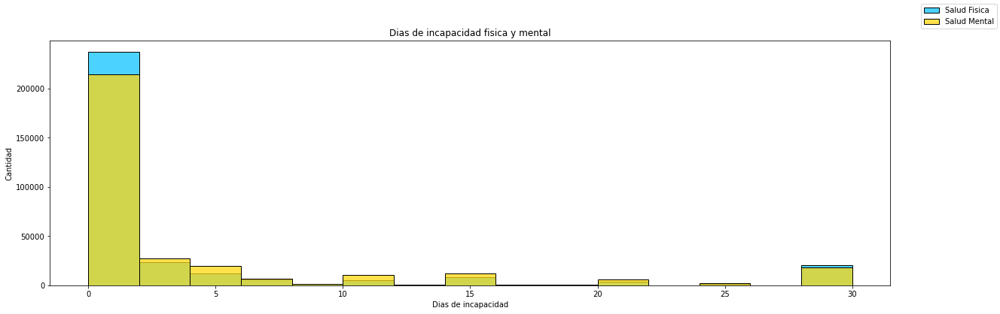

In [52]:
fig = plt.figure(figsize=(20,6))

sns.histplot(df.PhysicalHealth, bins=15, label='Salud Fisica', color="#10C3FF")
sns.histplot(df.MentalHealth, bins=15, label='Salud Mental', color="#FFD710")

fig.legend()
plt.xlabel('Dias de incapacidad')
plt.ylabel('Cantidad')
plt.title('Dias de incapacidad fisica y mental')

plt.show()

Se observa que la mayor parte de los pacientes indican que ningun dia se sintieron mal fisica o mentalmente. 

### 3.4 Enfermedades cardiacas por categoria de edad y genero

Primero revisaremos la distribución por genero de los pacientes, y en un segundo cuadro, solo de los que presentan enfermedades cardiacas.

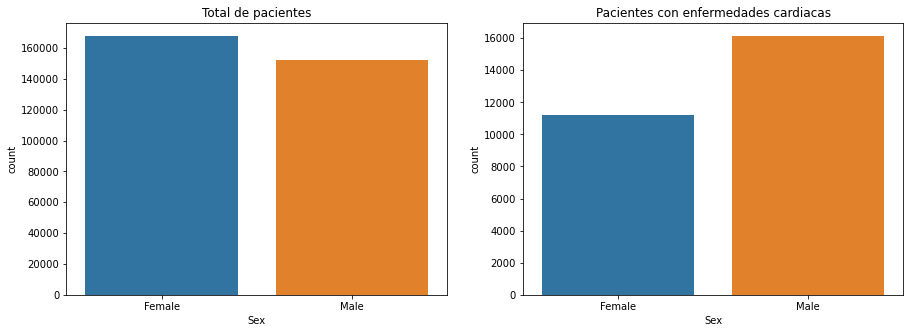

In [53]:
fig, ax =plt.subplots(1,2, figsize=(15,5))

sns.countplot(data = df, x = df["Sex"], ax=ax[0])
ax[0].set(title='Total de pacientes')

sns.countplot(data = df, x = df["Sex"][df["HeartDisease"] == 1], ax=ax[1])
ax[1].set(title='Pacientes con enfermedades cardiacas')

plt.show()

A pesar que en el total de los pacientes la mayoria son mujeres, si solo consideramos a los pacientes con problemas cardiacos, se onserva una mayor predominancia de los pacientes masculinos.

In [54]:
# Importamos plotly.express para generar el cuadro dinamico.
import plotly.express as px

Finalmente realizamos un cuadro que incluya las categorias de edad.

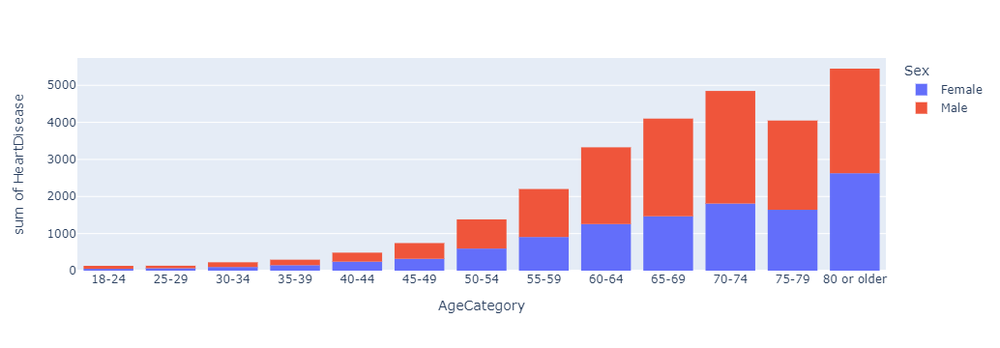

In [55]:
px.histogram(df, x='AgeCategory',y="HeartDisease", color="Sex").update_xaxes(categoryorder="category ascending")

Observamos que la mayoria de los pacientes con problemas cardiacos se encuentran desde los 60 años a mas. Asimismo que de esos, en su mayoria son hombres.

## 4. Storytelling:


Remitiendonos al gráfico del punto 3.4 hallamos una correlación directa entre las variables "rango etario" y "ataques cardiacos". Así mismo, hemos notado que aunque la mayoría de personas de nuestro muestreo corresponden al género femenino, las enfermedades se dan en un mayor porcentage en pacientes de género masculino. Lo que nos hace cuestionarnos es:
- ¿Existe una relación directa entre el género masculino y la posibilidad de contraer una enfermedad coronaria?
- ¿Hay alguna característica racial que nos predisponga a contraerla?¿Existe una relación directa entre el consumo del alcohol y tabaco con la predisposición a contraer dicha enfermedad?. 
- La correlación hallada entre la propensión a contraer enfermedades cardíacas y el género masculino, ¿Es una relación interpelada por la culturalidad?